# ML - Regression for 4 SiPM with 11MeV neutrons (x,y)=(0,0) (halfx,halfy)=(25,25), SiPM at (x,y)=(-15,-15),(-15,15),(15,15),(15,-15)

In [1]:
# Load libraries
import pandas as pd
from pandas import read_csv
import numpy as np
import seaborn as sns
import plotly.graph_objects as go
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt 
from sklearn.preprocessing import StandardScaler
from sklearn.inspection import permutation_importance
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import KFold
from sklearn.model_selection import validation_curve
from sklearn.model_selection import learning_curve
#Classification
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
#Regression
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.neural_network import MLPRegressor
#Metrics Class.
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
#Metrics Regr.
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
#Data Sets
from sklearn.datasets import fetch_california_housing

Loading dataset and printing description

In [2]:
df = pd.read_csv('neutron_2D.csv')
print(df)

             vx        vy        vz  xpos0  ypos0  photons0  xpos1  ypos1  \
0    -13.729500   2.42261  7.657900  -15.0  -15.0        14  -15.0   15.0   
1     -0.459889   5.61675 -0.059527  -15.0  -15.0        26  -15.0   15.0   
2     10.825700 -20.50170  8.782710  -99.9  -99.9        -1  -15.0   15.0   
3     16.264200   2.17639 -9.666160  -99.9  -99.9        -1  -99.9  -99.9   
4     16.290800  -2.17300 -5.827790  -99.9  -99.9        -1  -99.9  -99.9   
...         ...       ...       ...    ...    ...       ...    ...    ...   
1886 -16.910000  -4.16102  0.241372  -15.0  -15.0         9  -15.0   15.0   
1887 -16.275900  -7.95942 -2.558120  -15.0  -15.0         3  -15.0   15.0   
1888  11.824000 -10.09730 -6.218040  -15.0  -15.0         2  -15.0   15.0   
1889  18.612000  20.86330  4.160610  -99.9  -99.9        -1  -99.9  -99.9   
1890  -4.917840 -10.64530 -9.918800  -15.0  -15.0         1  -99.9  -99.9   

      photons1  xpos2  ypos2  photons2  xpos3  ypos3  photons3  
0         

In [3]:
df.head(10)

,vx,vy,vz,xpos0,ypos0,photons0,xpos1,ypos1,photons1,xpos2,ypos2,photons2,xpos3,ypos3,photons3
0,-13.729500,2.42261,7.657900,-15.0,-15.0,14,-15.0,15.0,22,15.0,-15.0,7,15.0,15.0,6
1,-0.459889,5.61675,-0.059527,-15.0,-15.0,26,-15.0,15.0,31,15.0,-15.0,11,15.0,15.0,17
2,10.825700,-20.50170,8.782710,-99.9,-99.9,-1,-15.0,15.0,1,-99.9,-99.9,-1,-99.9,-99.9,-1
3,16.264200,2.17639,-9.666160,-99.9,-99.9,-1,-99.9,-99.9,-1,-99.9,-99.9,-1,-99.9,-99.9,-1
4,16.290800,-2.17300,-5.827790,-99.9,-99.9,-1,-99.9,-99.9,-1,-99.9,-99.9,-1,15.0,15.0,1
5,17.686500,-2.20517,-3.684100,-99.9,-99.9,-1,-99.9,-99.9,-1,-99.9,-99.9,-1,-99.9,-99.9,-1
6,-15.423000,-10.77360,-5.714490,-99.9,-99.9,-1,-99.9,-99.9,-1,-99.9,-99.9,-1,-99.9,-99.9,-1
7,7.940320,-18.04740,7.814430,-15.0,-15.0,1,-99.9,-99.9,-1,15.0,-15.0,1,-99.9,-99.9,-1
8,11.665900,-11.97640,-5.234020,-15.0,-15.0,40,-15.0,15.0,29,15.0,-15.0,78,15.0,15.0,44
9,-8.018490,11.59270,3.507250,-99.9,-99.9,-1,-99.9,-99.9,-1,-99.9,-99.9,-1,-99.9,-99.9,-1


Display the type of variables

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1891 entries, 0 to 1890
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   vx        1891 non-null   float64
 1   vy        1891 non-null   float64
 2   vz        1891 non-null   float64
 3   xpos0     1891 non-null   float64
 4   ypos0     1891 non-null   float64
 5   photons0  1891 non-null   int64  
 6   xpos1     1891 non-null   float64
 7   ypos1     1891 non-null   float64
 8   photons1  1891 non-null   int64  
 9   xpos2     1891 non-null   float64
 10  ypos2     1891 non-null   float64
 11  photons2  1891 non-null   int64  
 12  xpos3     1891 non-null   float64
 13  ypos3     1891 non-null   float64
 14  photons3  1891 non-null   int64  
dtypes: float64(11), int64(4)
memory usage: 221.7 KB


In [5]:
#Remove unwanted rows
df = df[df['photons0'] >= 1]
df = df[df['photons1'] >= 1]
df = df[df['photons2'] >= 1]
df = df[df['photons3'] >= 1]

In [6]:
#scatter_matrix(df)
#plt.rcParams["figure.figsize"] = (20,20)
#plt.show()

In [7]:
#feature engineering
df['frac_photon0'] = df['photons0']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])
df['frac_photon1'] = df['photons1']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])
df['frac_photon2'] = df['photons2']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])
df['frac_photon3'] = df['photons3']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])
df['posXfrac_photon0'] = df['xpos0']*df['photons0']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])
df['posXfrac_photon1'] = df['xpos1']*df['photons1']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])
df['posXfrac_photon2'] = df['xpos2']*df['photons2']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])
df['posXfrac_photon3'] = df['xpos3']*df['photons3']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])
df['posYfrac_photon0'] = df['ypos0']*df['photons0']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])
df['posYfrac_photon1'] = df['ypos1']*df['photons1']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])
df['posYfrac_photon2'] = df['ypos2']*df['photons2']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])
df['posYfrac_photon3'] = df['ypos3']*df['photons3']/(df['photons0']+df['photons1']+df['photons2']+df['photons3'])

In [8]:
# Drop the unwanted columns
columns_drop = ["xpos0","ypos0","xpos1","ypos1","xpos2","ypos2","xpos3","ypos3"]
subset = df.drop(columns=columns_drop)
subset_feature = subset.drop(columns=["vx","vy","vz"])
print(subset)

             vx        vy        vz  photons0  photons1  photons2  photons3  \
0    -13.729500   2.42261  7.657900        14        22         7         6   
1     -0.459889   5.61675 -0.059527        26        31        11        17   
8     11.665900 -11.97640 -5.234020        40        29        78        44   
12     4.499400  15.82860  5.130190        10        19        12         9   
13    -5.412530  12.23090  1.340700        21        30        18        24   
...         ...       ...       ...       ...       ...       ...       ...   
1883  22.003800  17.80760 -3.658750        11        14        17        12   
1884  -5.134100 -19.54900  0.687786         8         5        10         4   
1886 -16.910000  -4.16102  0.241372         9        10         5         3   
1887 -16.275900  -7.95942 -2.558120         3         5         3         2   
1888  11.824000 -10.09730 -6.218040         2         1         2         1   

      frac_photon0  frac_photon1  frac_photon2  fra

In [9]:
#_ = sns.pairplot(data=subset, hue="vx", palette="viridis")

In [10]:
subset.info()

<class 'pandas.core.frame.DataFrame'>
Index: 860 entries, 0 to 1888
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   vx                860 non-null    float64
 1   vy                860 non-null    float64
 2   vz                860 non-null    float64
 3   photons0          860 non-null    int64  
 4   photons1          860 non-null    int64  
 5   photons2          860 non-null    int64  
 6   photons3          860 non-null    int64  
 7   frac_photon0      860 non-null    float64
 8   frac_photon1      860 non-null    float64
 9   frac_photon2      860 non-null    float64
 10  frac_photon3      860 non-null    float64
 11  posXfrac_photon0  860 non-null    float64
 12  posXfrac_photon1  860 non-null    float64
 13  posXfrac_photon2  860 non-null    float64
 14  posXfrac_photon3  860 non-null    float64
 15  posYfrac_photon0  860 non-null    float64
 16  posYfrac_photon1  860 non-null    float64
 17  p

Split data set between training and testing sets

In [11]:
#Array and Data Split
array = subset.values
# X corresponds to the last 2 columns (features)
X = array[:,3:27]
# y is the first column of our dataset (target)
y = array[:,0:2]
#Data Split (80/20)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

# KNN regression

In [19]:
# KNN Regression
algo = KNeighborsRegressor()
#create 10 folds
kfold = KFold(n_splits=5, random_state=7, shuffle=True)
# Define our candidate hyperparameters
#n_neighbors = np.arange(2,10,1)
hp_candidates = [{'n_neighbors': [2,3,4,5,6,7,8,9], 'weights': ['uniform','distance']}]
# Search for best hyperparameters
grid = GridSearchCV(estimator=algo, param_grid=hp_candidates, cv=kfold, scoring='r2')
grid.fit(X_train, y_train)
# Get the results
#print(grid.best_score_)
#print(grid.best_estimator_)
#print(grid.best_params_)
print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))
#scoring = 'neg_mean_squared_error'
#results = cross_val_score(model, X, Y, cv=kfold, scoring=scoring)
#print(results.mean())

The best parameters are {'n_neighbors': 8, 'weights': 'uniform'} with a score of -0.03


In [20]:
#grid.cv_results_

In [21]:
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["res"])],axis=1)
grid_results.head()

,n_neighbors,weights,res
0,2,uniform,-0.262984
1,2,distance,-0.262984
2,3,uniform,-0.229979
3,3,distance,-0.229979
4,4,uniform,-0.098773


In [22]:
grid_contour = grid_results.groupby(['n_neighbors','weights']).mean()
grid_contour

res
n_neighbors weights           
2           distance -0.262984
            uniform  -0.262984
3           distance -0.229979
            uniform  -0.229979
4           distance -0.098773
            uniform  -0.098773
5           distance -0.163768
            uniform  -0.163768
6           distance -0.191955
            uniform  -0.191955
7           distance -0.120083
            uniform  -0.120083
8           distance -0.029532
            uniform  -0.029532
9           distance -0.037276
            uniform  -0.037276

In [23]:
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['n_neighbors', 'weights', 'res']
grid_pivot = grid_reset.pivot(index='n_neighbors', columns='weights')
grid_pivot

res          
weights      distance   uniform
n_neighbors                    
2           -0.262984 -0.262984
3           -0.229979 -0.229979
4           -0.098773 -0.098773
5           -0.163768 -0.163768
6           -0.191955 -0.191955
7           -0.120083 -0.120083
8           -0.029532 -0.029532
9           -0.037276 -0.037276

In [24]:
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values

# X and Y axes labels
layout = go.Layout(
            xaxis=go.layout.XAxis(
              title=go.layout.xaxis.Title(
              text='weights')
             ),
             yaxis=go.layout.YAxis(
              title=go.layout.yaxis.Title(
              text='n_neighbors') 
            ) )

fig = go.Figure(data = [go.Contour(z=z, x=x, y=y)], layout=layout )

fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=1000, height=1000,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

In [25]:
n_neighbors_best = grid.cv_results_['param_n_neighbors'][grid.best_index_]
weights_best = grid.cv_results_['param_weights'][grid.best_index_]
model = KNeighborsRegressor(n_neighbors=n_neighbors_best, weights=weights_best)
model.fit(X_train,y_train)
res = model.predict(X_test)
#print(res)

In [26]:
#Mean Squared Error (MSE)
print(mean_squared_error(res,y_test))

233.4194656733099


In [27]:
#Root Mean Squared Error (RMSE)
print(mean_squared_error(res,y_test,squared=False))

15.278071399012045


/home/codespace/.local/lib/python3.10/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [28]:
#Mean Absolute Error (MAE)
print(mean_absolute_error(res,y_test))

12.96662667760274


In [29]:
#dataframe with results
df_test = pd.DataFrame(y_test, columns =['test'])
df_pred = pd.DataFrame(res, columns =['pred'])
df = pd.concat([df_test,df_pred],axis=1)
df['diff'] = df['test'] - df['pred']

/home/codespace/.local/lib/python3.10/site-packages/pandas/plotting/_matplotlib/misc.py:100: UserWarning:

Attempting to set identical low and high xlims makes transformation singular; automatically expanding.

/home/codespace/.local/lib/python3.10/site-packages/pandas/plotting/_matplotlib/misc.py:101: UserWarning:

Attempting to set identical low and high ylims makes transformation singular; automatically expanding.

/home/codespace/.local/lib/python3.10/site-packages/pandas/plotting/_matplotlib/misc.py:91: UserWarning:

Attempting to set identical low and high xlims makes transformation singular; automatically expanding.



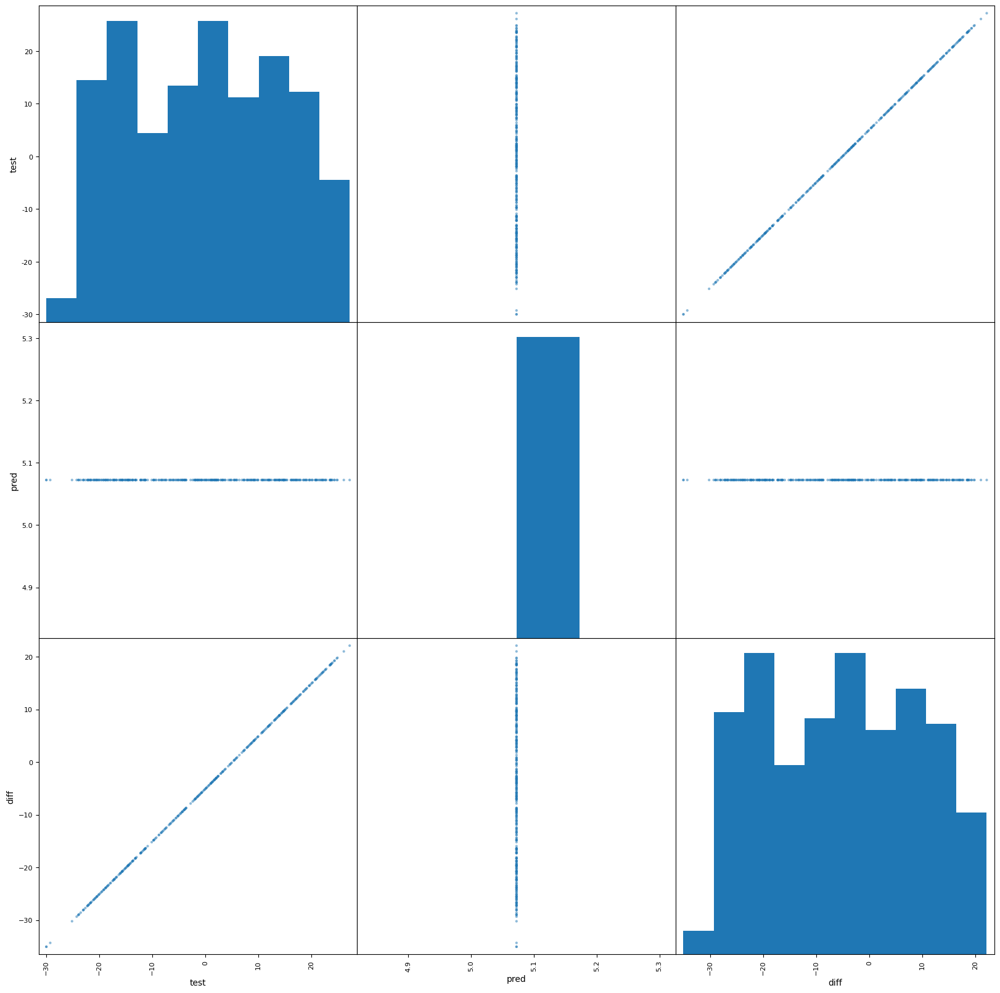

In [30]:
scatter_matrix(df)
plt.rcParams["figure.figsize"] = (20,20)
plt.show()

In [31]:
df

,test,pred,diff
0,-8.79924,5.072377,-13.871617
1,18.83290,5.072377,13.760523
2,-17.16200,5.072377,-22.234377
3,23.82080,5.072377,18.748423
4,20.94350,5.072377,15.871123
...,...,...,...
360,18.44410,5.072377,13.371723
361,-17.91250,5.072377,-22.984877
362,11.28140,5.072377,6.209023
363,22.00510,5.072377,16.932723


# Random Forrest

In [12]:
# Random Forrest
algo = RandomForestRegressor()
#create folds
kfold = KFold(n_splits=3, random_state=7, shuffle=True)
# Define our candidate hyperparameters
max_features_range = np.arange(1,5,1)
n_estimators_range = np.arange(100,200,10)
param_grid = dict(max_features=max_features_range, n_estimators=n_estimators_range)
# Search for best hyperparameters
grid = GridSearchCV(estimator=algo, param_grid=param_grid, cv=kfold, scoring='r2', verbose=4, n_jobs=2)
grid.fit(X_train, y_train)
# Get the results
#print(grid.best_score_)
#print(grid.best_estimator_)
#print(grid.best_params_)
print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))

Fitting 3 folds for each of 40 candidates, totalling 120 fits


[CV 2/3] END ..max_features=1, n_estimators=100;, score=0.633 total time=   0.3s
[CV 1/3] END ..max_features=1, n_estimators=100;, score=0.623 total time=   0.3s
[CV 3/3] END ..max_features=1, n_estimators=100;, score=0.591 total time=   0.5s
[CV 1/3] END ..max_features=1, n_estimators=110;, score=0.610 total time=   0.6s
[CV 2/3] END ..max_features=1, n_estimators=110;, score=0.638 total time=   0.3s
[CV 3/3] END ..max_features=1, n_estimators=110;, score=0.588 total time=   0.3s
[CV 1/3] END ..max_features=1, n_estimators=120;, score=0.611 total time=   0.4s
[CV 2/3] END ..max_features=1, n_estimators=120;, score=0.639 total time=   0.3s
[CV 3/3] END ..max_features=1, n_estimators=120;, score=0.595 total time=   0.3s
[CV 1/3] END ..max_features=1, n_estimators=130;, score=0.601 total time=   0.4s
[CV 2/3] END ..max_features=1, n_estimators=130;, score=0.633 total time=   0.4s
[CV 3/3] END ..max_features=1, n_estimators=130;, score=0.592 total time=   0.4s
[CV 1/3] END ..max_features=

In [13]:
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["r2"])],axis=1)
grid_contour = grid_results.groupby(['max_features','n_estimators']).mean()
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['max_features', 'n_estimators', 'r2']
grid_pivot = grid_reset.pivot(index='max_features', columns='n_estimators')
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values
# X and Y axes labels
layout = go.Layout(
            xaxis=go.layout.XAxis(
              title=go.layout.xaxis.Title(
              text='n_estimators')
             ),
             yaxis=go.layout.YAxis(
              title=go.layout.yaxis.Title(
              text='max_features') 
            ) )

fig = go.Figure(data = [go.Contour(z=z, x=x, y=y)], layout=layout )

fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

In [14]:
n_estimators_best = grid.cv_results_['param_n_estimators'][grid.best_index_]
max_features_best = grid.cv_results_['param_max_features'][grid.best_index_]
model = RandomForestRegressor(max_features=max_features_best, n_estimators=n_estimators_best)
model.fit(X_train,y_train)
res = model.predict(X_test)

In [15]:
#Mean Squared Error (MSE)
print(mean_squared_error(res,y_test))

78.60046293337518


In [16]:
#Root Mean Squared Error (RMSE)
print(mean_squared_error(res,y_test,squared=False))

8.856545946793014


/home/codespace/.local/lib/python3.10/site-packages/sklearn/metrics/_regression.py:483: FutureWarning:

'squared' is deprecated in version 1.4 and will be removed in 1.6. To calculate the root mean squared error, use the function'root_mean_squared_error'.



In [17]:
#Mean Absolute Error (MAE)
print(mean_absolute_error(res,y_test))

6.3646583165809645


In [18]:
df_test = pd.DataFrame(y_test, columns =['testX','testY'])
df_pred = pd.DataFrame(res, columns =['predX','predY'])
df_res = pd.concat([df_test,df_pred],axis=1)
print(df_res)

        testX     testY      predX      predY
0    -3.00589  14.24010  -2.872212   5.466569
1    -8.09374   3.30224 -11.871592   6.166466
2    10.64930  -7.24262  12.293793 -10.217820
3    -9.79263  21.17310 -10.308491  16.807758
4    -4.34896 -19.02490  -1.033379  -9.449483
..        ...       ...        ...        ...
167  -1.94595  -8.14168  -6.774764  -4.527564
168  -9.15082 -21.88800   5.669285   0.329705
169  -2.41098  -3.31077  -9.916910   1.996864
170  -7.68769 -23.88320   2.712191 -17.210580
171   5.75229   5.44291   6.974557   5.232126

[172 rows x 4 columns]


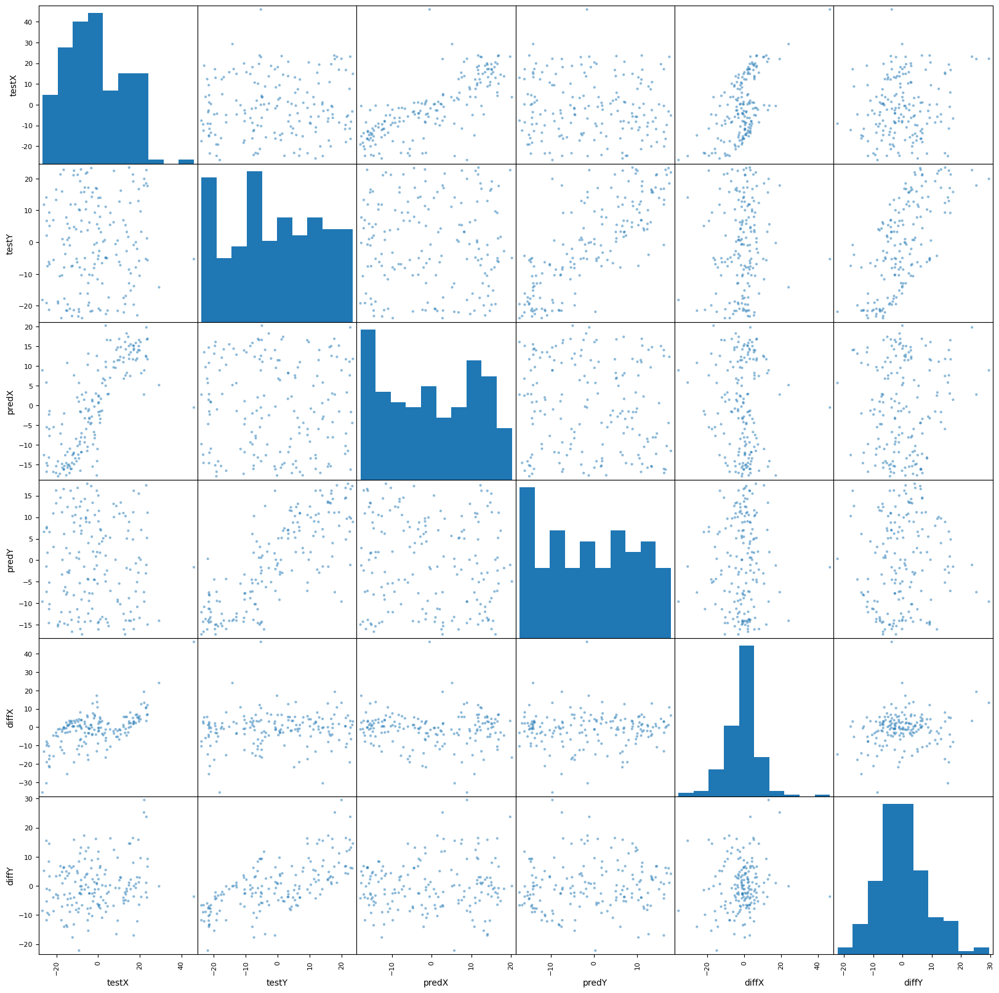

In [20]:
df_res['diffX'] = df_res['testX']-df_res['predX']
df_res['diffY'] = df_res['testY']-df_res['predY']
scatter_matrix(df_res)
plt.rcParams["figure.figsize"] = (20,20)
plt.show()

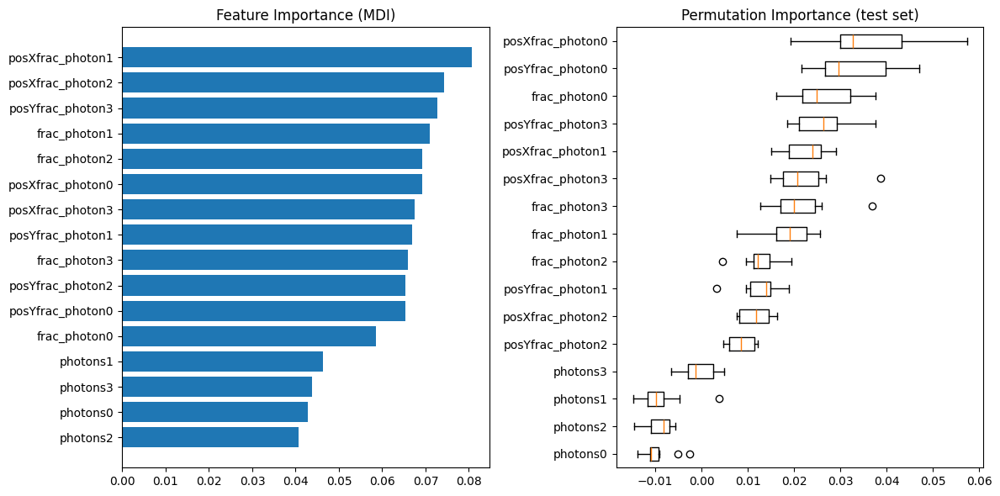

In [21]:
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
column_headers = list(subset_feature.columns.values)
plt.yticks(pos, np.array(column_headers)[sorted_idx])
plt.title("Feature Importance (MDI)")

result = permutation_importance(
    model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(
    result.importances[sorted_idx].T,
    vert=False,
    labels=np.array(column_headers)[sorted_idx],
)
plt.title("Permutation Importance (test set)")
fig.tight_layout()
plt.show()

In [54]:
df_res.describe()

,test,pred,diff
count,365.000000,365.000000,365.000000
mean,-0.782953,-0.799101,0.016147
std,14.140150,12.195246,9.317231
min,-40.400800,-25.158349,-28.745853
25%,-12.160400,-10.814177,-5.255583
50%,0.224422,-2.036995,0.149861
75%,11.332200,8.256659,6.243399
max,28.495300,25.180347,25.644346


# Gradient Boosting

In [40]:
# Gradient Boosting
algo = GradientBoostingRegressor()
#create 5 folds
kfold = KFold(n_splits=5, random_state=7, shuffle=True)
# Define our candidate hyperparameters
max_features_range = np.arange(4,7,1)
n_estimators_range = np.arange(150,250,10)
param_grid = dict(max_features=max_features_range, n_estimators=n_estimators_range)
# Search for best hyperparameters
grid = GridSearchCV(estimator=algo, param_grid=param_grid, cv=kfold, scoring='r2', verbose=4, n_jobs=2)
grid.fit(X_train, y_train)
# Get the results
#print(grid.best_score_)
#print(grid.best_estimator_)
#print(grid.best_params_)
print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 30 candidates, totalling 150 fits


[CV 1/5] END ..max_features=4, n_estimators=150;, score=0.812 total time=   4.1s
[CV 2/5] END ..max_features=4, n_estimators=150;, score=0.806 total time=   4.5s
[CV 3/5] END ..max_features=4, n_estimators=150;, score=0.802 total time=   4.2s
[CV 4/5] END ..max_features=4, n_estimators=150;, score=0.782 total time=   3.9s
[CV 5/5] END ..max_features=4, n_estimators=150;, score=0.791 total time=   3.6s
[CV 1/5] END ..max_features=4, n_estimators=160;, score=0.815 total time=   3.9s
[CV 2/5] END ..max_features=4, n_estimators=160;, score=0.808 total time=   4.3s
[CV 3/5] END ..max_features=4, n_estimators=160;, score=0.801 total time=   4.0s
[CV 4/5] END ..max_features=4, n_estimators=160;, score=0.783 total time=   4.5s
[CV 5/5] END ..max_features=4, n_estimators=160;, score=0.787 total time=   4.8s
[CV 1/5] END ..max_features=4, n_estimators=170;, score=0.815 total time=   3.9s
[CV 2/5] END ..max_features=4, n_estimators=170;, score=0.811 total time=   4.3s
[CV 3/5] END ..max_features=

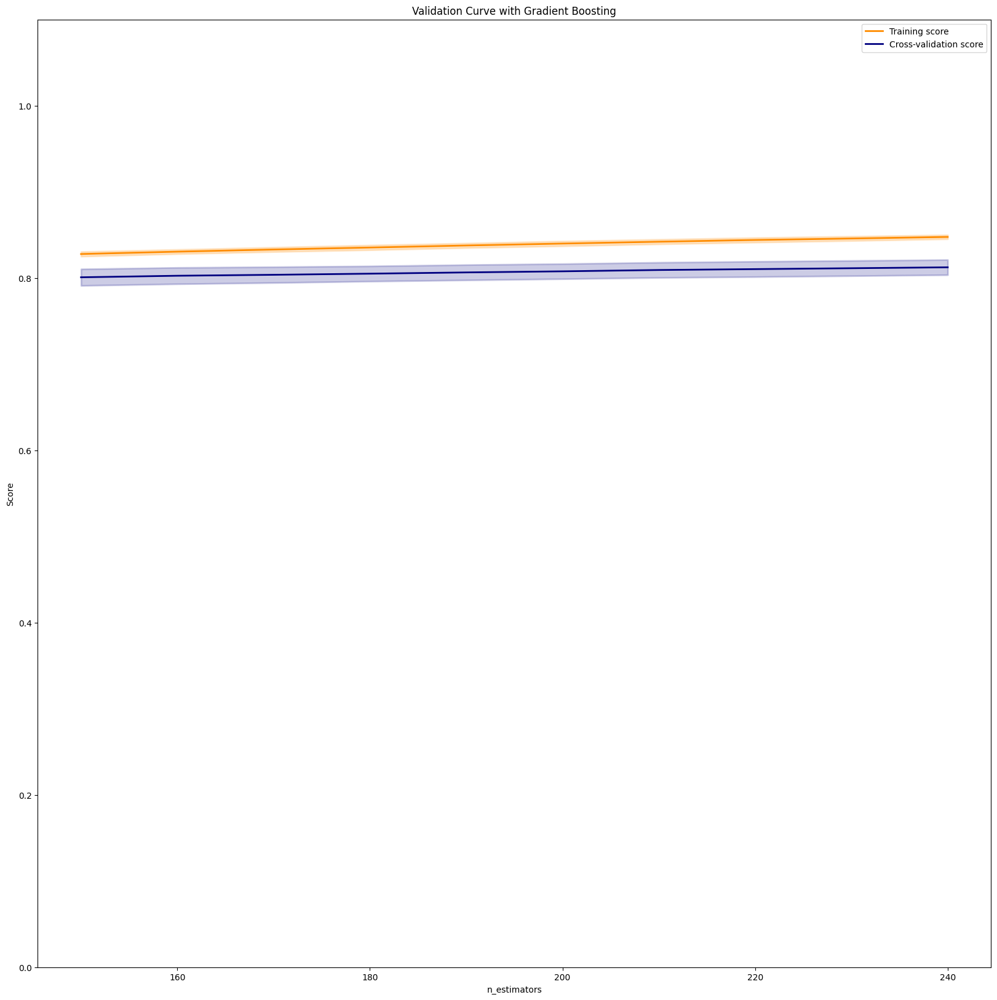

In [41]:
#validation curve for single parameter
param_range = np.arange(150,250,10)
train_scores, valid_scores = validation_curve(
    algo,
    X_train,
    y_train,
    param_name="n_estimators",
    param_range=param_range,
    scoring="r2",
    n_jobs=2,
)
train_scores_mean = np.mean(train_scores, axis=1)
train_scores_std = np.std(train_scores, axis=1)
valid_scores_mean = np.mean(valid_scores, axis=1)
valid_scores_std = np.std(valid_scores, axis=1)

plt.title("Validation Curve with Gradient Boosting")
plt.xlabel("n_estimators")
plt.ylabel("Score")
plt.ylim(0.0, 1.1)
lw = 2
plt.plot(
    param_range, train_scores_mean, label="Training score", color="darkorange", lw=lw
)
plt.fill_between(
    param_range,
    train_scores_mean - train_scores_std,
    train_scores_mean + train_scores_std,
    alpha=0.2,
    color="darkorange",
    lw=lw,
)
plt.plot(
    param_range, valid_scores_mean, label="Cross-validation score", color="navy", lw=lw
)
plt.fill_between(
    param_range,
    valid_scores_mean - valid_scores_std,
    valid_scores_mean + valid_scores_std,
    alpha=0.2,
    color="navy",
    lw=lw,
)
plt.legend(loc="best")
plt.show()

In [42]:
#grid.cv_results_

In [43]:
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["r2"])],axis=1)
grid_contour = grid_results.groupby(['max_features','n_estimators']).mean()
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['max_features', 'n_estimators', 'r2']
grid_pivot = grid_reset.pivot(index='max_features', columns='n_estimators')
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values
# X and Y axes labels
layout = go.Layout(
            xaxis=go.layout.XAxis(
              title=go.layout.xaxis.Title(
              text='n_estimators')
             ),
             yaxis=go.layout.YAxis(
              title=go.layout.yaxis.Title(
              text='max_features') 
            ) )

fig = go.Figure(data = [go.Contour(z=z, x=x, y=y)], layout=layout )

fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

In [44]:
n_estimators_best = grid.cv_results_['param_n_estimators'][grid.best_index_]
max_features_best = grid.cv_results_['param_max_features'][grid.best_index_]
model = GradientBoostingRegressor(max_features=max_features_best, n_estimators=n_estimators_best)
model.fit(X_train,y_train)
res = model.predict(X_test)

In [45]:
#Mean Squared Error (MSE)
print(mean_squared_error(res,y_test))

0.2440325305009121


In [46]:
#Root Mean Squared Error (RMSE)
print(mean_squared_error(res,y_test,squared=False))

0.4939964883487656


In [47]:
#Mean Absolute Error (MAE)
print(mean_absolute_error(res,y_test))

0.3413606228443068


In [48]:
#dataframe with results
df_test = pd.DataFrame(y_test, columns =['test'])
df_pred = pd.DataFrame(res, columns =['pred'])
df = pd.concat([df_test,df_pred],axis=1)
df['diff'] = df['test'] - df['pred']

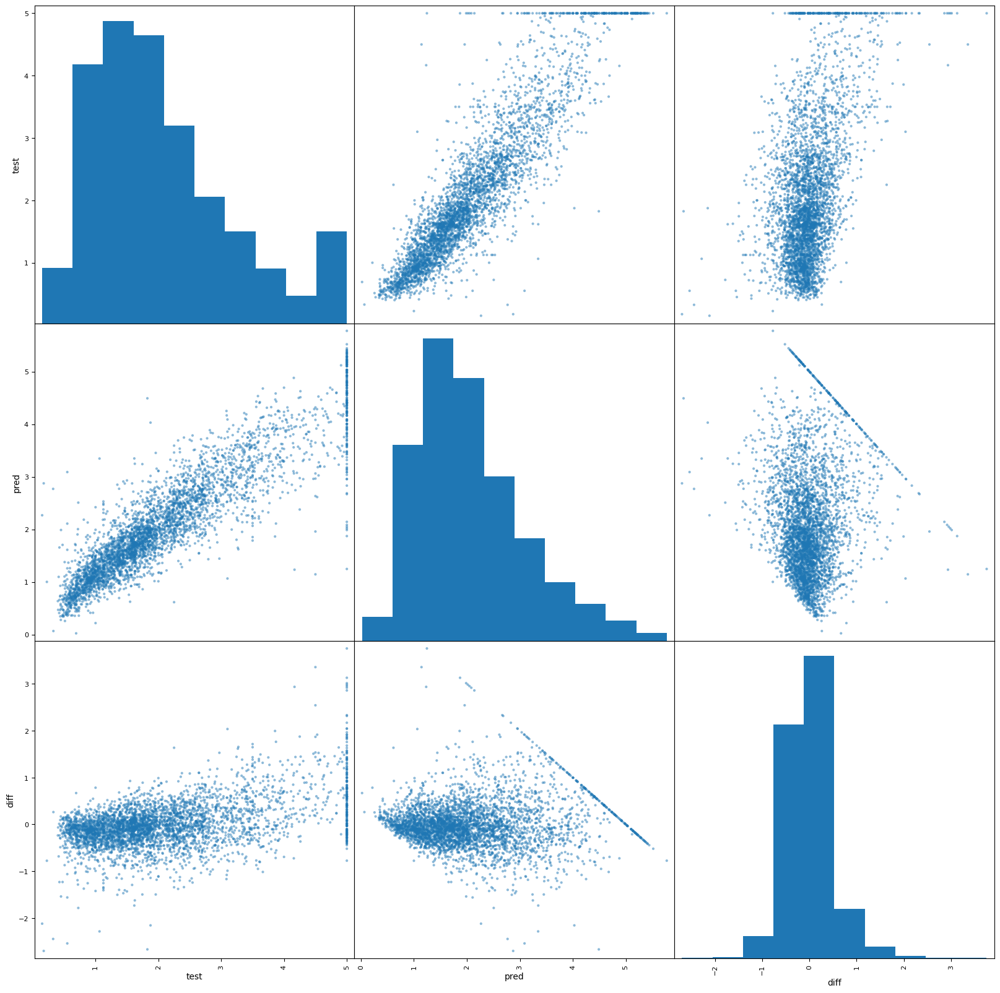

In [49]:
scatter_matrix(df)
plt.rcParams["figure.figsize"] = (20,20)
plt.show()

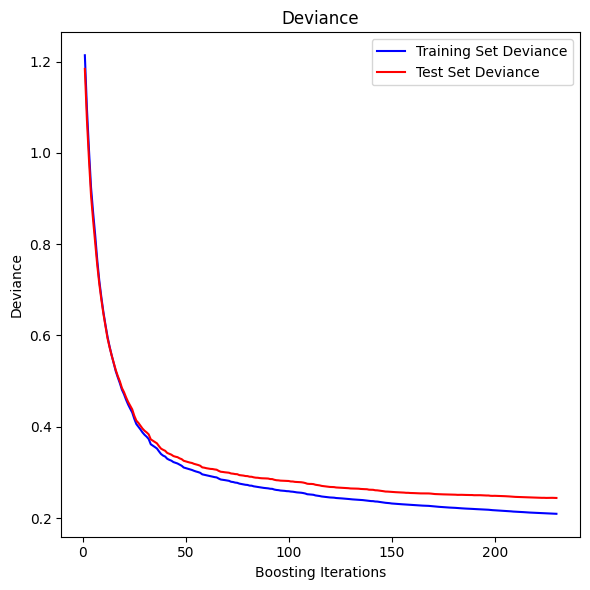

In [50]:
test_score = np.zeros((n_estimators_best,), dtype=np.float64)
for i, y_pred in enumerate(model.staged_predict(X_test)):
    test_score[i] = mean_squared_error(y_test, y_pred)

fig = plt.figure(figsize=(6, 6))
plt.subplot(1, 1, 1)
plt.title("Deviance")
plt.plot(
    np.arange(n_estimators_best) + 1,
    model.train_score_,
    "b-",
    label="Training Set Deviance",
)
plt.plot(
    np.arange(n_estimators_best) + 1, test_score, "r-", label="Test Set Deviance"
)
plt.legend(loc="upper right")
plt.xlabel("Boosting Iterations")
plt.ylabel("Deviance")
fig.tight_layout()
plt.show()

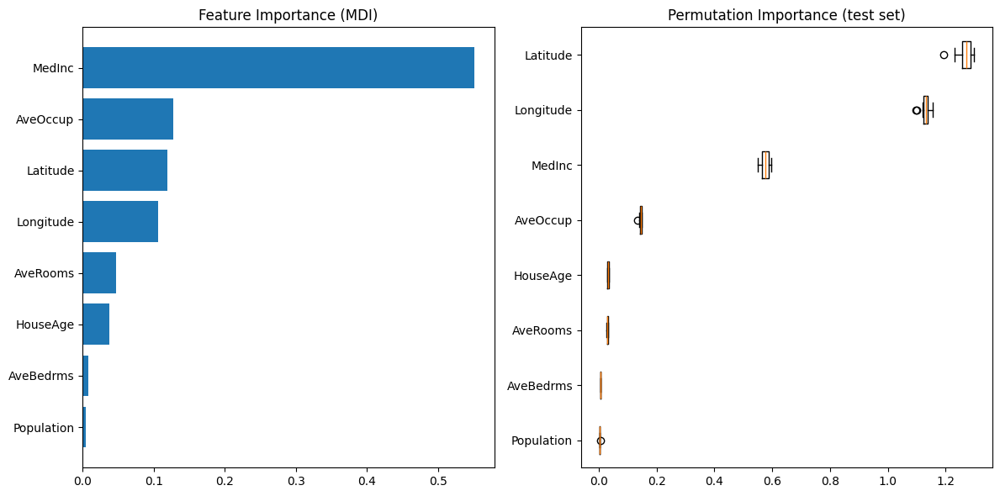

In [51]:
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
column_headers = list(california_housing.data.columns.values)
plt.yticks(pos, np.array(column_headers)[sorted_idx])
plt.title("Feature Importance (MDI)")

result = permutation_importance(
    model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(
    result.importances[sorted_idx].T,
    vert=False,
    labels=np.array(column_headers)[sorted_idx],
)
plt.title("Permutation Importance (test set)")
fig.tight_layout()
plt.show()

# Adaboost

In [66]:
# Adaboost
algo = AdaBoostRegressor(estimator=DecisionTreeRegressor())

# create 5 folds
kfold = KFold(n_splits=5, random_state=7, shuffle=True)

# Define our candidate hyperparameters
param_grid = {'estimator__max_depth':[i for i in range(2,11,2)],
              #'estimator__min_samples_leaf':[5,10],
              'n_estimators':np.arange(10,210,10)}

# Search for best hyperparameters
grid = GridSearchCV(estimator=algo, param_grid=param_grid, cv=kfold, scoring='r2', verbose=2, n_jobs=2)
grid.fit(X_train, y_train)

# Get the results
#print(grid.best_score_)
#print(grid.best_estimator_)
#print(grid.best_params_)

print("The best parameters are %s with a score of %0.2f"
      % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END ............estimator__max_depth=2, n_estimators=10; total time=   0.4s
[CV] END ............estimator__max_depth=2, n_estimators=10; total time=   0.3s
[CV] END ............estimator__max_depth=2, n_estimators=10; total time=   0.3s
[CV] END ............estimator__max_depth=2, n_estimators=10; total time=   0.3s
[CV] END ............estimator__max_depth=2, n_estimators=10; total time=   0.3s
[CV] END ............estimator__max_depth=2, n_estimators=20; total time=   0.6s
[CV] END ............estimator__max_depth=2, n_estimators=20; total time=   0.5s
[CV] END ............estimator__max_depth=2, n_estimators=20; total time=   0.7s
[CV] END ............estimator__max_depth=2, n_estimators=20; total time=   0.7s
[CV] END ............estimator__max_depth=2, n_estimators=20; total time=   0.5s
[CV] END ............estimator__max_depth=2, n_estimators=30; total time=   0.6s
[CV] END ............estimator__max_depth=2, n

In [67]:
#grid.cv_results_

In [68]:
grid_results = pd.concat([pd.DataFrame(grid.cv_results_["params"]),pd.DataFrame(grid.cv_results_["mean_test_score"], columns=["r2"])],axis=1)
grid_contour = grid_results.groupby(['estimator__max_depth','n_estimators']).mean()
grid_reset = grid_contour.reset_index()
grid_reset.columns = ['estimator__max_depth', 'n_estimators', 'r2']
grid_pivot = grid_reset.pivot(index='estimator__max_depth', columns='n_estimators')
x = grid_pivot.columns.levels[1].values
y = grid_pivot.index.values
z = grid_pivot.values
# X and Y axes labels
layout = go.Layout(
            xaxis=go.layout.XAxis(
              title=go.layout.xaxis.Title(
              text='n_estimators')
             ),
             yaxis=go.layout.YAxis(
              title=go.layout.yaxis.Title(
              text='estimator__max_depth') 
            ) )

fig = go.Figure(data = [go.Contour(z=z, x=x, y=y)], layout=layout )

fig.update_layout(title='Hyperparameter tuning', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

In [71]:
n_estimators_best = grid.cv_results_['param_n_estimators'][grid.best_index_]
estimator_max_depth_best = grid.cv_results_['param_estimator__max_depth'][grid.best_index_]
model = AdaBoostRegressor(estimator=DecisionTreeRegressor(max_depth=estimator_max_depth_best), n_estimators=n_estimators_best)
model.fit(X_train,y_train)
res = model.predict(X_test)

In [72]:
#Mean Squared Error (MSE)
print(mean_squared_error(res,y_test))

0.2577943151153863


In [73]:
#Root Mean Squared Error (RMSE)
print(mean_squared_error(res,y_test,squared=False))

0.5077344927374802


In [74]:
#Mean Absolute Error (MAE)
print(mean_absolute_error(res,y_test))

0.3746702075381351


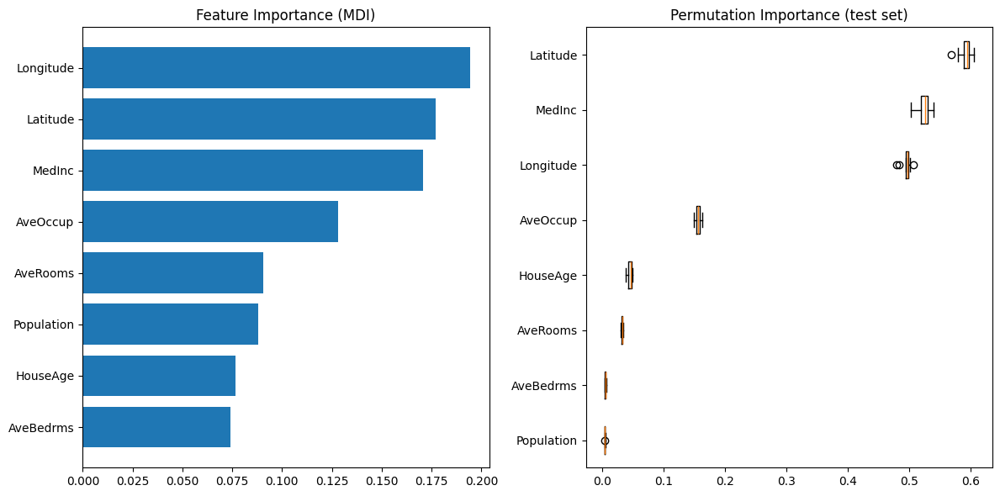

In [75]:
feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
pos = np.arange(sorted_idx.shape[0]) + 0.5
fig = plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.barh(pos, feature_importance[sorted_idx], align="center")
column_headers = list(california_housing.data.columns.values)
plt.yticks(pos, np.array(column_headers)[sorted_idx])
plt.title("Feature Importance (MDI)")

result = permutation_importance(
    model, X_test, y_test, n_repeats=10, random_state=42, n_jobs=2
)
sorted_idx = result.importances_mean.argsort()
plt.subplot(1, 2, 2)
plt.boxplot(
    result.importances[sorted_idx].T,
    vert=False,
    labels=np.array(column_headers)[sorted_idx],
)
plt.title("Permutation Importance (test set)")
fig.tight_layout()
plt.show()

In [76]:
#dataframe with results
df_test = pd.DataFrame(y_test, columns =['test'])
df_pred = pd.DataFrame(res, columns =['pred'])
df = pd.concat([df_test,df_pred],axis=1)
df['diff'] = df['test'] - df['pred']

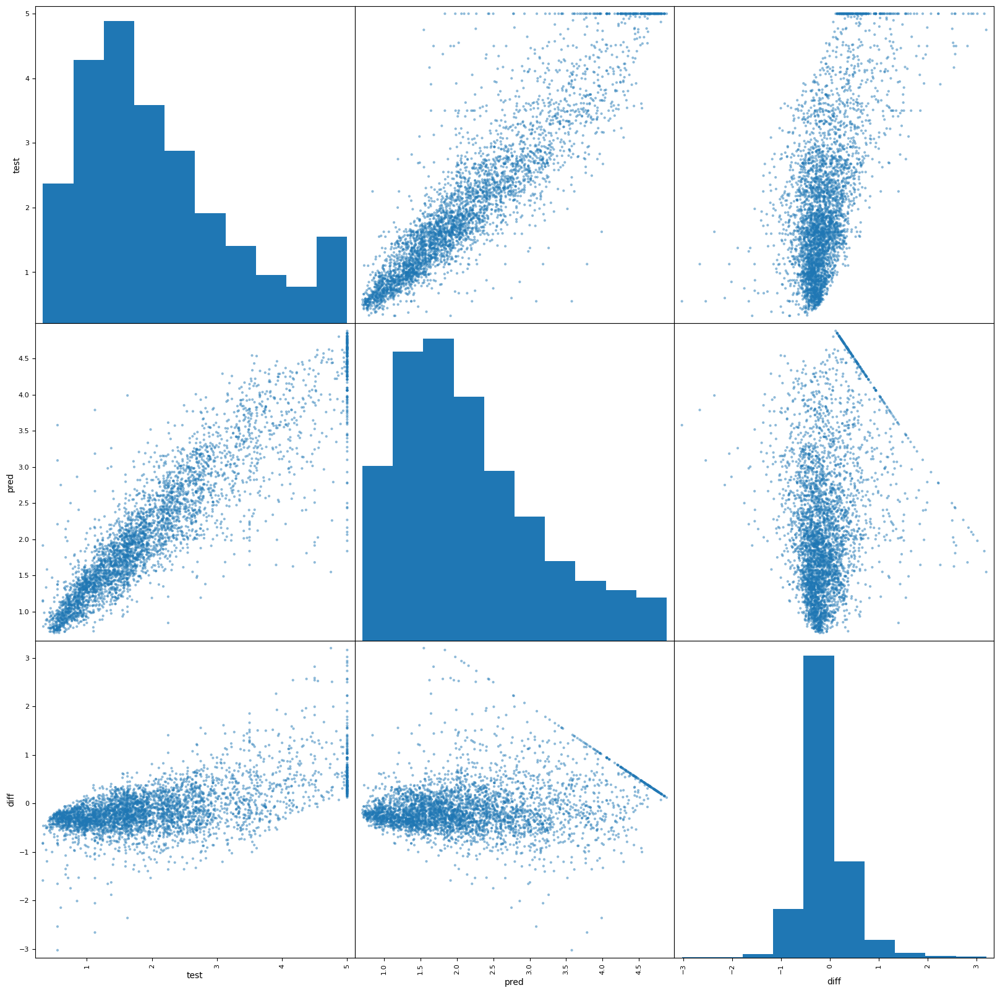

In [77]:
scatter_matrix(df)
plt.rcParams["figure.figsize"] = (20,20)
plt.show()